# Using Diffusion to Generate Images from Text

Nipun Batra  
2024-01-01

References

1.  [PromptHero
    guide](https://github.com/paddleboard-ai/useful-notebooks/blob/main/LocalJourney.ipynb)

In [1]:
%pip install --upgrade \
  diffusers \
  transformers \
  safetensors \
  sentencepiece \
  accelerate \
  bitsandbytes \
  torch \
  huggingface_hub --quiet

In [3]:
from huggingface_hub import login

login()

### Basic Imports

In [ ]:
# Display the images in a grid
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
from PIL import Image
import io

In [4]:
from diffusers import DiffusionPipeline, DPMSolverMultistepScheduler, AutoencoderKL
import torch
pipe = DiffusionPipeline.from_pretrained(
    "prompthero/openjourney", 
    torch_dtype=torch.float16
)
vae = AutoencoderKL.from_pretrained("stabilityai/sd-vae-ft-mse", torch_dtype=torch.float16).to("cuda")
pipe.scheduler = DPMSolverMultistepScheduler.from_config(pipe.scheduler.config)
pipe.vae = vae
pipe = pipe.to("cuda")

In [77]:
def generate_images(prompt, num_steps, num_variations, prompt_guidance, dimensions):
    random_seeds = [random.randint(0, 65000) for _ in range(num_variations)]
    images = pipe(prompt= num_variations * [prompt],
              num_inference_steps=num_steps,
              guidance_scale=prompt_guidance,
              height = dimensions[0],
              width = dimensions[1],
              generator = [torch.Generator('cuda').manual_seed(i) for i in random_seeds]
             ).images
    return images

In [78]:
import random


In [108]:
# Setting for image generation
prompt = 'Small happy dog anf owner learning to walk on a rainy day. Colored photography. Leica lens. Hi-res. hd 8k --ar 2:3'
num_steps = 150
num_variations = 4
prompt_guidance = 8
dimensions = (400, 600) # (width, height) tuple
random_seeds = [random.randint(0, 65000) for _ in range(num_variations)]

In [109]:
images = generate_images(prompt, num_steps, num_variations, prompt_guidance, dimensions)

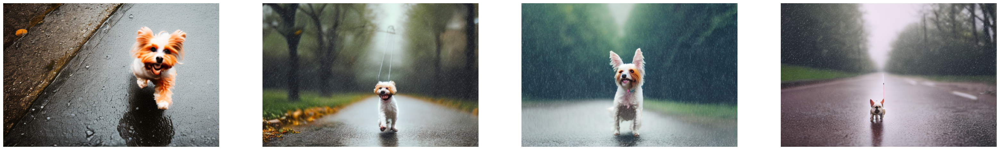

In [110]:


def display_images(images, num_variations, dimensions):
    fig = plt.figure(figsize=(dimensions[0]/10, dimensions[1]/10))
    columns = num_variations
    rows = 1
    for i in range(1, columns*rows +1):
        img = images[i-1]
        fig.add_subplot(rows, columns, i)
        plt.imshow(img)
        # hide axes
        plt.axis('off')
    plt.show()
    
display_images(images, num_variations, dimensions)

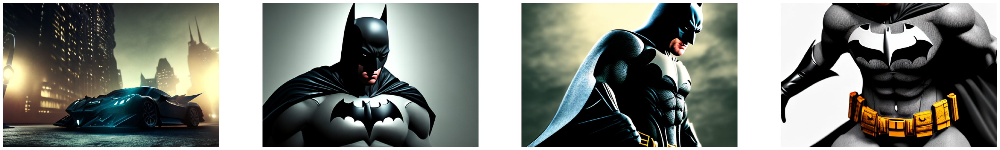

In [111]:
prompt = "Batman, cinematic lighting, dark background, very high resolution 3D render."


images = generate_images(prompt, num_steps, num_variations, prompt_guidance, dimensions)
display_images(images, num_variations, dimensions)

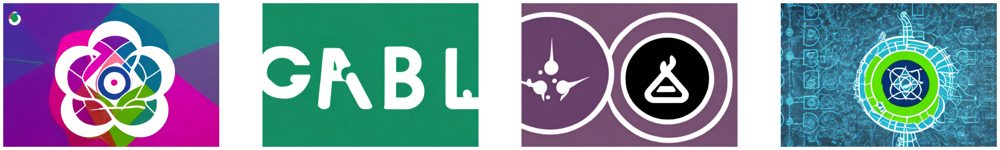

In [112]:
prompt = "A logo for a research group in India called Sustainability lab that works on AI for sustainability. Show AI as the central theme. Show applications in health, air quality"

images = generate_images(prompt, num_steps, num_variations, prompt_guidance, dimensions)
display_images(images, num_variations, dimensions)

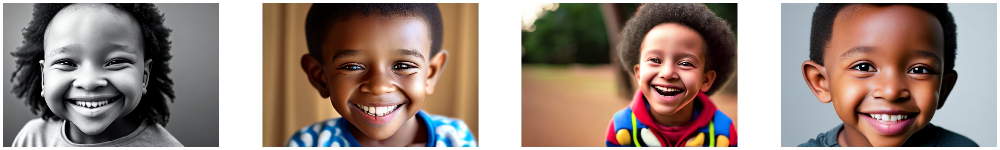

In [113]:
prompt = "Portrait of a small kid with a big smile."

images = generate_images(prompt, num_steps, num_variations, prompt_guidance, dimensions)
display_images(images, num_variations, dimensions)

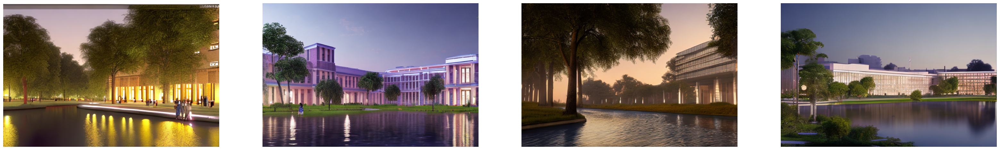

In [114]:
prompt = "A photorealistic render of an academic campus in India, on the edges of a river, low-light, evening."

images = generate_images(prompt, num_steps, num_variations, prompt_guidance, dimensions)
display_images(images, num_variations, dimensions)